# Cell type annotation

In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
from insitupy import InSituData, CACHE
import pandas as pd
from insitupy.utils import generate_mock_reference
import scanpy as sc
import numpy as np

## Load Xenium data into `InSituData` object

Now the Xenium data can be parsed by providing the data path to the `InSituPy` project folder.

In [3]:
insitupy_project = Path(CACHE / "out/demo_insitupy_project")

In [4]:
xd = InSituData.read(insitupy_project)

In [5]:
xd

InSituData
Method:		Xenium
Slide ID:	0001879
Sample ID:	Replicate 1
Path:		C:\Users\ge37voy\.cache\InSituPy\out\demo_insitupy_project


No modalities loaded.

In [6]:
xd.load_all(skip="transcripts")

In [7]:
xd

InSituData
Method:		Xenium
Slide ID:	0001879
Sample ID:	Replicate 1
Path:		C:\Users\ge37voy\.cache\InSituPy\out\demo_insitupy_project

    ➤ images
       CD20:	(25778, 35416)
       HE:	(25778, 35416, 3)
       HER2:	(25778, 35416)
       nuclei:	(25778, 35416)
    ➤ cells
       MultiCellData with main layer 'main'
           matrix
               AnnData object with n_obs × n_vars = 156447 × 297
               obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'n_genes', 'leiden', 'cell_type_dc', 'cell_type_dc_sub', 'cell_type_tacco', 'cell_type_publ_x', 'cell_type_publ_y', 'cell_type_dc_sub_final', 'cell_type_publ'
               var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
               uns: 'cell_type_dc_colors', 'cell_type_dc_sub', 'cell_type_dc_sub_colors', 'cell_type_dc_sub_final_colors', 'cell_type_p

## Prepare panel

In [8]:
# load panel annotated
panel = pd.read_csv("../../demo_data/demo_panel/Xenium_hBreast_v1_metadata.csv")
panel.head()

,Genes,Ensembl_ID,Num_Probesets,Codewords,Annotation
0,ABCC11,ENSG00000121270,7,1,Breast cancer
1,ACTA2,ENSG00000107796,8,1,Smooth muscle cells
2,ACTG2,ENSG00000163017,8,1,Breast myoepithelial cells
3,ADAM9,ENSG00000168615,8,1,Breast glandular cells
4,ADGRE5,ENSG00000123146,8,1,Dendritic cells


In [9]:

# Remove ambiguous terms ("Immune cells")
panel = panel[~(panel["Annotation"] == "Immune cells")].copy()
panel = panel[~(panel["Annotation"] == "Epithelial cells")].copy()
panel["Annotation"].unique()

array(['Breast cancer', 'Smooth muscle cells',
       'Breast myoepithelial cells', 'Breast glandular cells',
       'Dendritic cells', 'Adipocytes', 'Macrophages',
       'Endothelial cells', 'B cells', 'Fibroblasts', 'T cells',
       'Monocytes', 'NK cells', 'Neutrophils', 'Mast cells',
       'Myeloid cells', 'Plasma cells'], dtype=object)

# Cell annotation

There are many ways to annotate cell types and which one is the best depends a lot on the specific dataset. Below we will introduce two marker gene-based approaches. As source for the marker genes we use the _Xenium In Situ_ panel but any other kind of marker gene resource would also be valid.

Here is a list of available tools for cell type annotation/label transfer (only the first is showcased here):
- Decoupler (use statistical methods to test whether a set of marker genes is enriched in a particular cell  population (cluster)): 
  https://decoupler-py.readthedocs.io/en/latest/
- TACCO (uses optimal transport methods to transfer labels from a reference to a target dataset): https://www.nature.com/articles/s41587-023-01657-3
- Celltypist (automated cell type annotation tool for scRNA-seq datasets on the basis of logistic regression classifiers optimised by the stochastic gradient descent algorithm): 
https://www.celltypist.org, https://colab.research.google.com/github/Teichlab/celltypist/blob/main/docs/notebook/celltypist_tutorial.ipynb

- SCANVI (semi-supervised model for single-cell transcriptomics data):
  https://docs.scvi-tools.org/en/latest/user_guide/models/scanvi.html

## Decoupler

This approach uses a Univariate Linear Model (ULM) as described in the [`decoupler` package](https://decoupler-py.readthedocs.io/en/latest/index.html). A detailed description of this approach can be found [here](https://decoupler.readthedocs.io/en/latest/notebooks/scell/rna_sc.html). 

In [10]:
# install decoupler
!pip install decoupler

In [11]:
import decoupler as dc

### Prepare data for analysis

In [12]:
adata = xd.cells.matrix.copy()

In [19]:
# in case there are colors from previous analysis cycles, remove them
for key in ['cell_type_dc_colors', 'cell_type_dc_sub',
            'cell_type_dc_sub_colors', 'cell_type_dc_sub_final_colors',
            'cell_type_publ_colors', 'cell_type_tacco_colors']:
    try:
        del adata.uns[key]
    except KeyError:
        pass

In [21]:
panel.rename(columns={'Annotation' : 'source', 'Genes': 'target'})

,target,Ensembl_ID,Num_Probesets,Codewords,source
0,ABCC11,ENSG00000121270,7,1,Breast cancer
1,ACTA2,ENSG00000107796,8,1,Smooth muscle cells
2,ACTG2,ENSG00000163017,8,1,Breast myoepithelial cells
3,ADAM9,ENSG00000168615,8,1,Breast glandular cells
4,ADGRE5,ENSG00000123146,8,1,Dendritic cells
...,...,...,...,...,...
275,VWF,ENSG00000110799,8,1,Endothelial cells
276,WARS,ENSG00000140105,8,1,Endothelial cells
277,ZEB1,ENSG00000148516,8,1,Breast cancer
278,ZEB2,ENSG00000169554,8,1,Breast cancer


### Run Over Representation Analysis (ORA)

In [22]:
dc.mt.ulm(
    data=adata,
    net=panel.rename(columns={'Annotation' : 'source', 'Genes': 'target'}),
    layer="counts",
    tmin=3,
    verbose=True,
    raw=False
    )

2025-08-27 11:25:58 | [INFO] ulm - Running ulm
2025-08-27 11:25:58 | [INFO] Extracted omics mat with 156447 rows (observations) and 297 columns (features)
2025-08-27 11:25:58 | [WARNING] weight not found in net.columns, adding it as:
net['weight'] = 1
2025-08-27 11:25:58 | [INFO] Network adjacency matrix has 264 unique features and 14 unique sources


  0%|          | 0/1 [00:00<?, ?it/s]

2025-08-27 11:25:58 | [INFO] ulm - fitting 14 univariate models of 297 observations (targets) with 295 degrees of freedom
2025-08-27 11:26:00 | [INFO] ulm - adjusting p-values by FDR
2025-08-27 11:26:00 | [INFO] ulm - done


In [23]:
score = dc.pp.get_obsm(adata, key="score_ulm")
score

AnnData object with n_obs × n_vars = 156447 × 14
    obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'n_genes', 'leiden', 'cell_type_dc', 'cell_type_dc_sub', 'cell_type_tacco', 'cell_type_publ_x', 'cell_type_publ_y', 'cell_type_dc_sub_final', 'cell_type_publ'
    uns: 'counts_location', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'OT', 'X_pca', 'X_umap', 'annotations', 'ora_estimate', 'ora_pvals', 'regions', 'spatial', 'score_ulm', 'padj_ulm'

In [24]:
padj = dc.pp.get_obsm(adata, key="padj_ulm")
padj

AnnData object with n_obs × n_vars = 156447 × 14
    obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'n_genes', 'leiden', 'cell_type_dc', 'cell_type_dc_sub', 'cell_type_tacco', 'cell_type_publ_x', 'cell_type_publ_y', 'cell_type_dc_sub_final', 'cell_type_publ'
    uns: 'counts_location', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'OT', 'X_pca', 'X_umap', 'annotations', 'ora_estimate', 'ora_pvals', 'regions', 'spatial', 'score_ulm', 'padj_ulm'

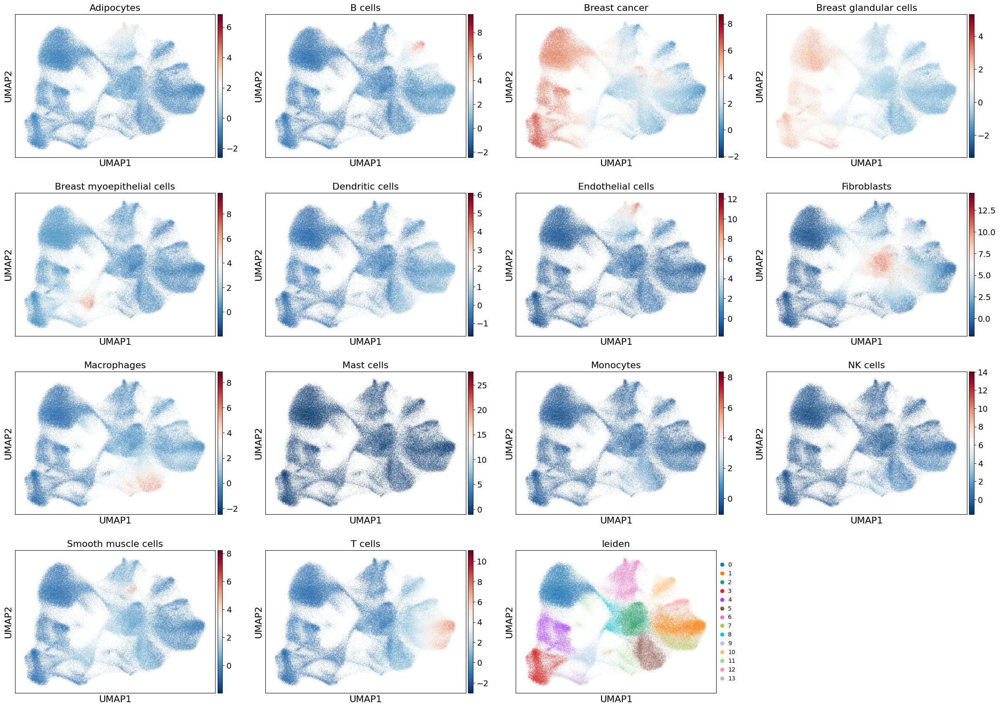

In [25]:
sc.pl.umap(score, color=score.var_names.tolist() + ["leiden"], cmap="RdBu_r")

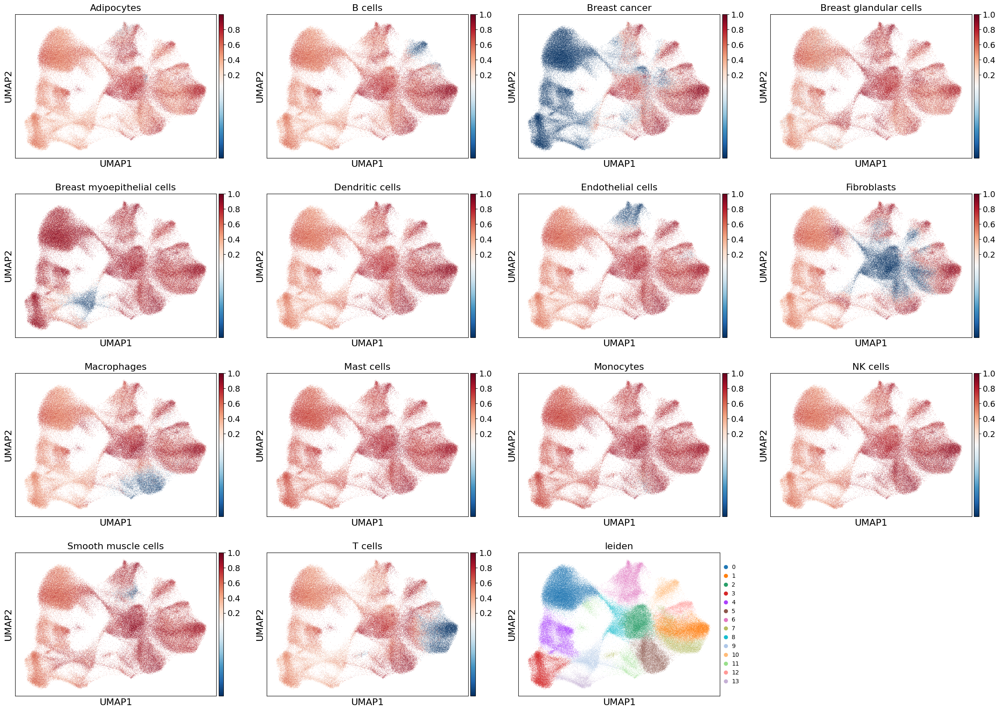

In [26]:
sc.pl.umap(padj, color=score.var_names.tolist() + ["leiden"], cmap="RdBu_r", vcenter=0.05)

Recluster cluster 6 containing the endothelial cells.

In [27]:
sc.tl.leiden(adata,
             restrict_to=('leiden', ["6"]),
             resolution=0.13,
             key_added='leiden_split')

sc.tl.leiden(adata,
             restrict_to=('leiden_split', ["2"]),
             resolution=1,
             key_added='leiden_split')

C:\Users\ge37voy\AppData\Local\Temp\ipykernel_32452\1018956021.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata,


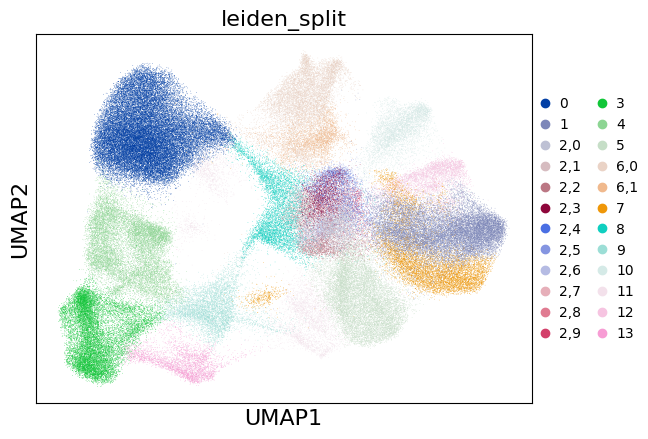

In [28]:
sc.pl.umap(adata, color="leiden_split")

Group all breast cancer clusters into one.

In [29]:
rename_dict = {"4": "0", "3": "0"}
adata.obs["leiden_summ"] = [rename_dict[elem] if elem in rename_dict else elem for elem in adata.obs["leiden_split"]]
adata.obs["leiden_summ"] = adata.obs["leiden_summ"].astype("category")

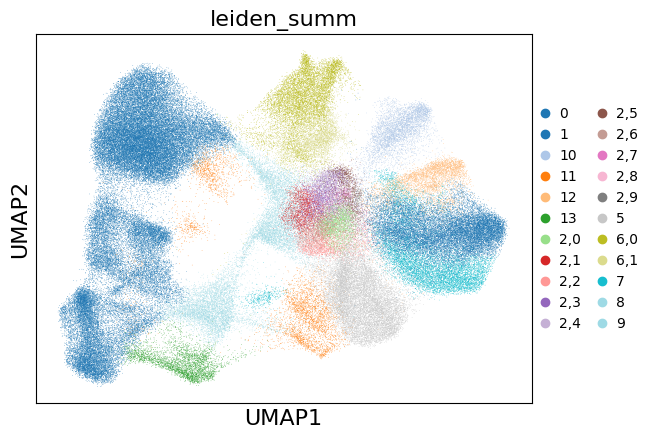

In [30]:
sc.pl.umap(adata, color="leiden_summ", palette="tab20")

Transfer new clusters into `AnnData` with scores.

In [31]:
score.obs["leiden_summ"] = adata.obs["leiden_summ"]

Perform statistical testing to determine which clusters correspond to which cell types.

In [32]:
df = dc.tl.rankby_group(adata=score, groupby="leiden_summ", reference="rest", method="t-test_overestim_var")
df = df[df["stat"] > 0]
df

,group,reference,name,stat,meanchange,pval,padj
0,0,rest,Breast cancer,525.809367,3.963649,0.000000e+00,0.000000e+00
1,0,rest,Breast glandular cells,486.657359,2.295569,0.000000e+00,0.000000e+00
12,0,rest,Breast myoepithelial cells,31.486037,0.191869,2.432368e-216,2.619474e-216
14,11,rest,Macrophages,70.234714,2.695620,0.000000e+00,0.000000e+00
15,11,rest,NK cells,50.019935,0.822476,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...
294,"2,5",rest,Fibroblasts,45.754687,4.756620,2.046578e-315,2.865209e-314
300,"2,5",rest,Breast cancer,8.590611,0.637985,1.843955e-17,3.687910e-17
302,"2,5",rest,Mast cells,6.500677,0.275261,1.045441e-10,1.626241e-10
303,"2,5",rest,Smooth muscle cells,6.196178,0.184115,7.021366e-10,9.829912e-10


In [33]:
n_ctypes = 3
ctypes_dict = df.groupby("group").head(n_ctypes).groupby("group")["name"].apply(lambda x: list(x)).to_dict()
ctypes_dict

C:\Users\ge37voy\AppData\Local\Temp\ipykernel_32452\777748877.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ctypes_dict = df.groupby("group").head(n_ctypes).groupby("group")["name"].apply(lambda x: list(x)).to_dict()


{'0': ['Breast cancer',
  'Breast glandular cells',
  'Breast myoepithelial cells'],
 '1': ['T cells', 'Dendritic cells', 'B cells'],
 '10': ['B cells', 'T cells', 'Fibroblasts'],
 '11': ['Macrophages', 'NK cells', 'Monocytes'],
 '12': ['B cells', 'Dendritic cells', 'T cells'],
 '13': ['Breast glandular cells',
  'Breast myoepithelial cells',
  'Breast cancer'],
 '2,0': ['Fibroblasts', 'Smooth muscle cells', 'Adipocytes'],
 '2,1': ['Fibroblasts', 'Smooth muscle cells', 'Mast cells'],
 '2,2': ['Fibroblasts', 'Smooth muscle cells', 'Mast cells'],
 '2,3': ['Fibroblasts', 'Smooth muscle cells', 'Adipocytes'],
 '2,4': ['Fibroblasts', 'Smooth muscle cells', 'Mast cells'],
 '2,5': ['Fibroblasts', 'Breast cancer', 'Mast cells'],
 '2,6': ['Fibroblasts', 'Smooth muscle cells', 'Adipocytes'],
 '2,7': ['Fibroblasts', 'Smooth muscle cells', 'Adipocytes'],
 '2,8': ['Fibroblasts', 'Mast cells', 'Smooth muscle cells'],
 '2,9': ['Adipocytes', 'Smooth muscle cells', 'Fibroblasts'],
 '5': ['Macrophages',

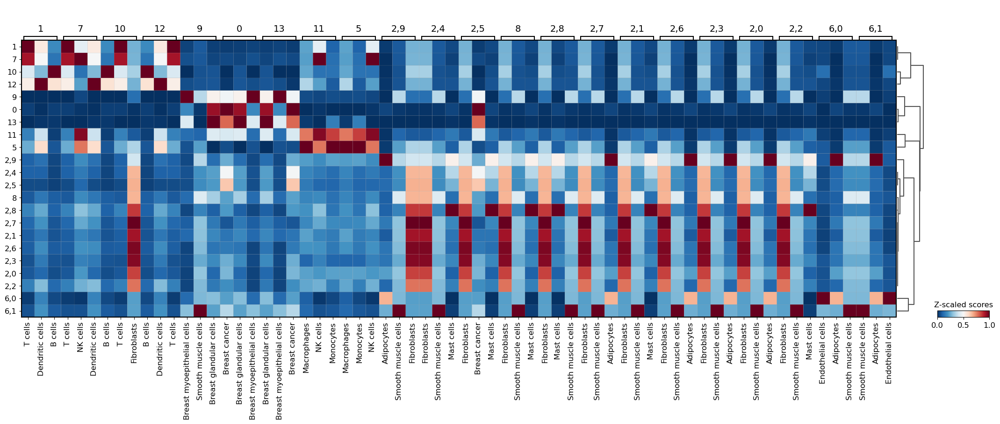

In [34]:
sc.pl.matrixplot(
    adata=score,
    var_names=ctypes_dict,
    groupby="leiden_summ",
    dendrogram=True,
    standard_scale="var",
    colorbar_title="Z-scaled scores",
    cmap="RdBu_r",
)

In [35]:
dict_ann = df[df["stat"] > 0].groupby("group").head(1).set_index("group")["name"].to_dict()
dict_ann

C:\Users\ge37voy\AppData\Local\Temp\ipykernel_32452\1491444522.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dict_ann = df[df["stat"] > 0].groupby("group").head(1).set_index("group")["name"].to_dict()


{'0': 'Breast cancer',
 '11': 'Macrophages',
 '2,1': 'Fibroblasts',
 '9': 'Breast myoepithelial cells',
 '6,0': 'Endothelial cells',
 '8': 'Fibroblasts',
 '6,1': 'Smooth muscle cells',
 '7': 'T cells',
 '1': 'T cells',
 '5': 'Macrophages',
 '10': 'B cells',
 '12': 'B cells',
 '2,3': 'Fibroblasts',
 '2,4': 'Fibroblasts',
 '2,2': 'Fibroblasts',
 '2,0': 'Fibroblasts',
 '2,6': 'Fibroblasts',
 '2,8': 'Fibroblasts',
 '13': 'Breast glandular cells',
 '2,7': 'Fibroblasts',
 '2,9': 'Adipocytes',
 '2,5': 'Fibroblasts'}

In [36]:
adata.obs['cell_type_dc'] = [dict_ann[clust] for clust in adata.obs['leiden_summ']]

... storing 'cell_type_dc' as categorical


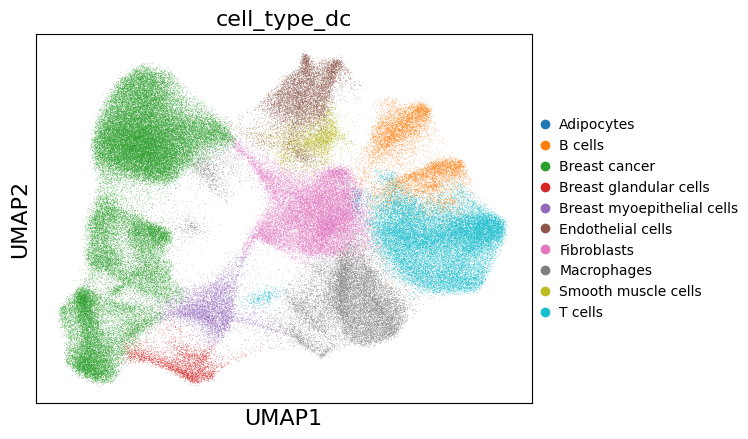

In [37]:
sc.pl.umap(adata, color='cell_type_dc',
           #save="_cell_type_dc.pdf"
           )

### Subclustering of breast cancer cells

There are multiple subclusters within the breast cancer cells which we will resolve by doing another Leiden clustering on top of those cells.

In [39]:
sc.tl.leiden(adata,
             restrict_to=('cell_type_dc', ["Breast cancer"]),
             resolution=0.4,
             key_added='cell_type_dc_sub'
             )

In [40]:
# modify names
adata.obs["cell_type_dc_sub"] = [
    f'{elem.split(",")[0]} subtype {int(elem.split(",")[1])+1}'
    if "Breast cancer" in elem else elem
    for elem in adata.obs["cell_type_dc_sub"]
    ]

... storing 'cell_type_dc_sub' as categorical


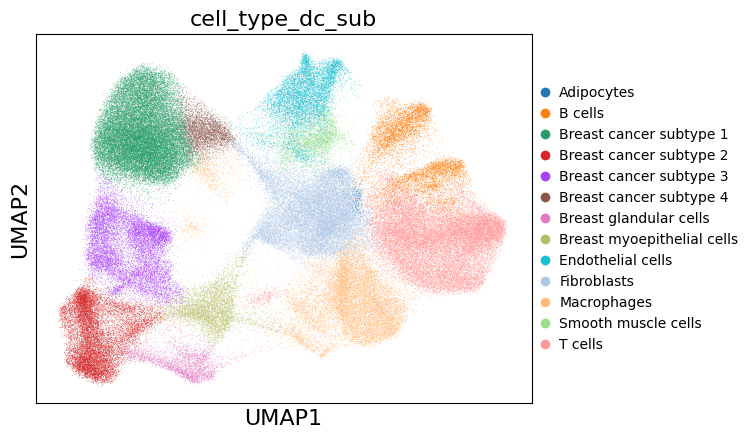

In [41]:
sc.pl.umap(adata, color='cell_type_dc_sub',
           #save="_cell_type_dc.pdf"
           )

Subcluster the breast cancer subtype 3 into two more.

In [42]:
sc.tl.leiden(adata,
             restrict_to=('cell_type_dc_sub', ["Breast cancer subtype 3"]),
             resolution=0.1,
             key_added='cell_type_dc_sub_st3'
             )

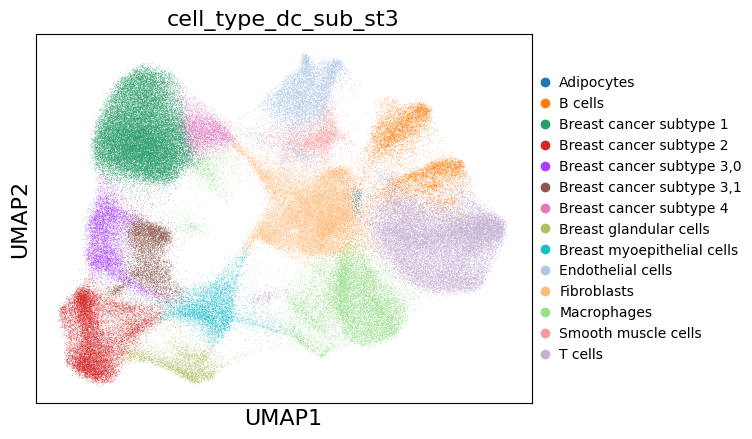

In [43]:
sc.pl.umap(adata, color='cell_type_dc_sub_st3',
           #save="_cell_type_dc.pdf"
           )

To resemble the annotation in the publication, we rename the cancer cells to subtype 1-5

In [50]:
rename_dict = {
    "Breast cancer subtype 4": "Breast cancer subtype 3",
    "Breast cancer subtype 3,0": "Breast cancer subtype 4",
    "Breast cancer subtype 3,1": "Breast cancer subtype 5",
    "Fibroblasts": "Stromal cells"
}

adata.obs["cell_type_dc_sub_final"] = [rename_dict[elem] if elem in rename_dict else elem for elem in adata.obs["cell_type_dc_sub_st3"]]

... storing 'cell_type_dc_sub_final' as categorical


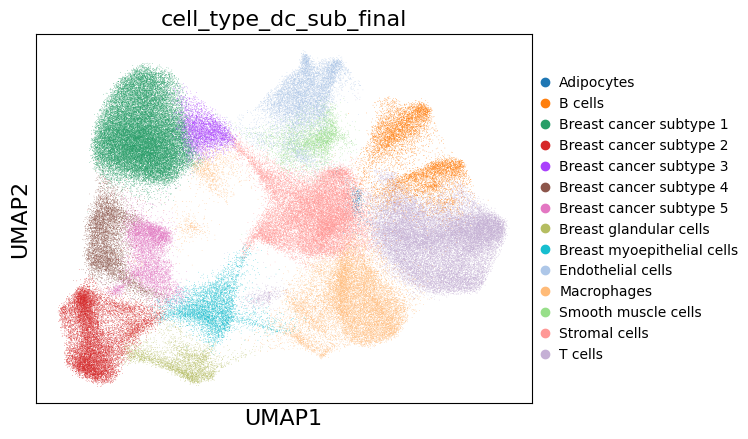

In [51]:
sc.pl.umap(adata, color='cell_type_dc_sub_final',
           #save="_cell_type_dc.pdf"
           )

Save colors and cell type annotations for reproducibility

In [52]:
cat = "cell_type_dc_sub_final"
mapping = dict(zip(adata.obs[cat].cat.categories, adata.uns[f"{cat}_colors"]))

In [53]:
mapping

{'Adipocytes': '#1f77b4',
 'B cells': '#ff7f0e',
 'Breast cancer subtype 1': '#279e68',
 'Breast cancer subtype 2': '#d62728',
 'Breast cancer subtype 3': '#aa40fc',
 'Breast cancer subtype 4': '#8c564b',
 'Breast cancer subtype 5': '#e377c2',
 'Breast glandular cells': '#b5bd61',
 'Breast myoepithelial cells': '#17becf',
 'Endothelial cells': '#aec7e8',
 'Macrophages': '#ffbb78',
 'Smooth muscle cells': '#98df8a',
 'Stromal cells': '#ff9896',
 'T cells': '#c5b0d5'}

In [54]:
import json

# cell_type_colors = {
#     "Adipocytes": "#f5deb3",
#     "B cells": "#4077B2",
#     "Breast cancer subtype 1": "#EE7F20",
#     "Breast cancer subtype 2": "#4E9E2F",
#     "Breast cancer subtype 3": "#C42E30",
#     "Breast cancer subtype 4": "#8E68BC",
#     "Breast cancer subtype 5": "#83574D",
#     "Breast glandular cells": "#D578C1",
#     "Breast myoepithelial cells": "#B9BB28",
#     "Endothelial cells": "#58BCCD",
#     "Fibroblasts": "#B2C6E7",
#     "Macrophages": "#F4BA78",
#     "Smooth muscle cells": "#A4DD88",
#     "T cells": "#F19796"
# }

cell_type_colors = {
    'Adipocytes': '#1f77b4',
    'B cells': '#ff7f0e',
    'Breast cancer subtype 1': '#279e68',
    'Breast cancer subtype 2': '#d62728',
    'Breast cancer subtype 3': '#aa40fc',
    'Breast cancer subtype 4': '#8c564b',
    'Breast cancer subtype 5': '#e377c2',
    'Breast glandular cells': '#b5bd61',
    'Breast myoepithelial cells': '#17becf',
    'Endothelial cells': '#aec7e8',
    'Macrophages': '#ffbb78',
    'Smooth muscle cells': '#98df8a',
    'Stromal cells': '#ff9896',
    'T cells': '#c5b0d5'
    }

outdir = Path("../../demo_data/demo_annotations/")
colors_json = outdir / "cell_type_colors.json"
cellannot_csv = outdir / "cell_type_annotation.csv"

with open(colors_json, 'w') as f:
    json.dump(cell_type_colors, f, indent=4)

adata.obs["cell_type_dc_sub_final"].to_csv(cellannot_csv)

To make the analysis reproducible, we load here previously saved cell type annotation and cell type colors.

In [55]:
import json

outdir = Path("../../demo_data/demo_annotations/")
colors_json = outdir / "cell_type_colors.json"
cellannot_csv = outdir / "cell_type_annotation.csv"

cellannot = pd.read_csv(cellannot_csv, index_col=0)
cellannot.index = cellannot.index.astype(str)

with open(colors_json, 'r') as f:
    cell_type_colors = json.load(f)

# add cell annotations
adata.obs["cell_type_dc_sub_final"] = cellannot["cell_type_dc_sub_final"]
adata.obs["cell_type_dc_sub_final"] = adata.obs["cell_type_dc_sub_final"].astype("category")

# make sure the colors are ordered correctly
ordered_colors = [cell_type_colors[elem] for elem in adata.obs["cell_type_dc_sub_final"].cat.categories]

# add colors to .uns
adata.uns["cell_type_dc_sub_final_colors"] = ordered_colors

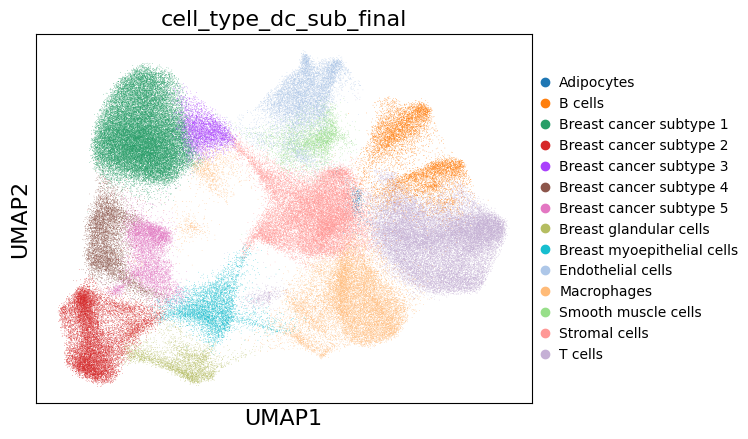

In [56]:
import matplotlib as mpl
with mpl.rc_context(rc={
    "savefig.dpi": 300,    # when saving
    "figure.figsize": tuple(mpl.rcParams['figure.figsize']), # optional; fixes aspect ratio
}):
    sc.pl.umap(adata, color='cell_type_dc_sub_final',
            save="_cell_type_dc_sub_final.png"
            )

In [57]:
from insitupy.plotting import plot_colorlegend

Saving figure to file figures/colorlegend_cell_type_dc_sub_final.pdf
Saved.


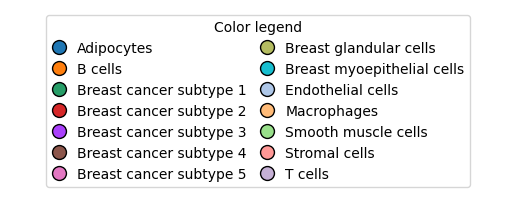

In [58]:
cat = "cell_type_dc_sub_final"
mapping = dict(zip(adata.obs[cat].cat.categories, adata.uns[f"{cat}_colors"]))
plot_colorlegend(mapping=mapping, savepath="figures/colorlegend_cell_type_dc_sub_final.pdf")

Add the results to the `InSituData` object

In [59]:
xd.cells.matrix.obs["cell_type_dc_sub_final"] = adata.obs["cell_type_dc_sub_final"]
xd.cells.matrix.uns["cell_type_dc_sub_final_colors"] = adata.uns["cell_type_dc_sub_final_colors"]

In [ ]:
xd.show()

INFO: New layer '🌍 Region 3 (Katja)' created.
INFO: New layer '🌍 Region 4 (Katja)' created.
INFO: New layer '🌍 Region 2 (Katja)' created.
INFO: New layer '🌍 Region 1 (Katja)' created.
INFO: New layer '🌍 Region 3 (Katja)' created.
INFO: New layer '🌍 Region 4 (Katja)' created.
INFO: New layer '🌍 Region 2 (Katja)' created.
INFO: New layer '🌍 Region 1 (Katja)' created.
INFO: New layer '🔬 DCIS with stromal reaction (Katja)' created.
INFO: New layer '🔬 DCIS intermediate (Katja)' created.
INFO: New layer '🔬 DCIS (Katja)' created.
INFO: New layer '🔬 Invasive (Katja)' created.
INFO: New layer '🔬 DCIS with stromal reaction (Katja)' created.
INFO: New layer '🔬 DCIS intermediate (Katja)' created.
INFO: New layer '🔬 DCIS (Katja)' created.
INFO: New layer '🔬 Invasive (Katja)' created.


### Caution!

This cell type annotation is only a demonstration and most probably contains inaccuracies. Cell type annotation needs to be done very carefully and results need to be double checked with pathological experts!

## Import annotation from publication

For this dataset, a previously [published](https://www.nature.com/articles/s41467-023-43458-x) cell annotation exists already and is available [here](https://www.10xgenomics.com/products/xenium-in-situ/preview-dataset-human-breast). For comparison with our annotations, we import this here.

In [62]:
cell_annot_path = "../../demo_data/demo_panel/Cell_Barcode_Type_Matrices.csv"
ca = pd.read_csv(cell_annot_path)
ca = ca.set_index("Barcode")
ca.index = ca.index.astype(str)
ca.columns = ["cell_type_publ"]

Rename some of the cell type annotations

In [63]:
ca["cell_type_publ"] = ca["cell_type_publ"].replace(
    {"IRF7+_DCs": "DCs",
    "LAMP3+_DCs": "DCs",
    "Prolif_Invasive_Tumor": "Invasive_Tumor_Prolif",
    "CD4+_T_Cells": "T_Cells_CD4+",
    "CD8+_T_Cells": "T_Cells_CD8+"}
)
ca["cell_type_publ"] = ca["cell_type_publ"].str.replace("_", " ")

In [64]:
ca["cell_type_publ"].value_counts()

cell_type_publ
Stromal                    41422
Invasive Tumor             34374
DCIS 1                     12923
DCIS 2                     11683
Macrophages 1              11174
Endothelial                 8931
Unlabeled                   8554
T Cells CD4+                8453
Myoepi ACTA2+               7078
T Cells CD8+                6940
B Cells                     4987
Invasive Tumor Prolif       3775
Myoepi KRT15+               2860
Macrophages 2               1624
Perivascular-Like            847
DCs                          792
Stromal & T Cell Hybrid      607
T Cell & Tumor Hybrid        589
Mast Cells                   167
Name: count, dtype: int64

In [65]:
if "cell_type_publ" in xd.cells.matrix.obs.columns:
    del xd.cells.matrix.obs["cell_type_publ"]

In [66]:
xd.cells.matrix.obs = pd.merge(left=xd.cells.matrix.obs, right=ca,
         left_index=True, right_index=True)

Remove cells marked as "Hybrid"

In [67]:
from insitupy.preprocessing import filter_cells

In [68]:
mask = ~xd.cells.matrix.obs["cell_type_publ"].str.contains("Hybrid")

In [69]:
filter_cells(data=xd, mask=mask)

In [70]:
xd.cells.matrix

View of AnnData object with n_obs × n_vars = 156447 × 297
    obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'n_genes', 'leiden', 'cell_type_dc', 'cell_type_dc_sub', 'cell_type_tacco', 'cell_type_publ_x', 'cell_type_publ_y', 'cell_type_dc_sub_final', 'cell_type_publ'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'cell_type_dc_colors', 'cell_type_dc_sub', 'cell_type_dc_sub_colors', 'cell_type_dc_sub_final_colors', 'cell_type_publ_colors', 'cell_type_tacco_colors', 'counts_location', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'OT', 'X_pca', 'X_umap', 'annotations', 'ora_estimate', 'ora_pvals', 'regions', 'spatial'
    varm: 'OT', 'PCs'
    layers: 'counts', 'norm_counts'
    obsp: 'connectivities', 'distances'

c:\Users\ge37voy\AppData\Local\miniconda3\envs\insitupy\lib\site-packages\anndata\_core\anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'cell_type_publ' as categorical


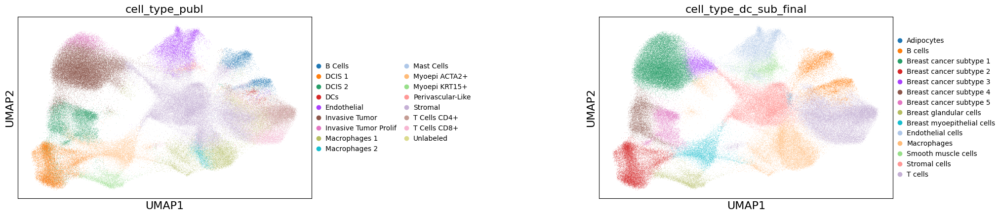

In [71]:
sc.pl.umap(xd.cells.matrix, color=["cell_type_publ", "cell_type_dc_sub_final"],
           wspace=0.8, ncols=2)

## Visualization in napari

The cell type annotation can be selected in the "Show data" widget on the right under "observation" and then be displayed with the "Add" button:

<left><img src="../../demo_data/demo_screenshots/napari_cell_annotation_marked.jpg" width="1000"/></left>

When the the correct layer is selected in the layer list on the left, it is possible to hover with the mouse onto a cell and see the annotation of this cell on the bottom left under "value".



### Investigate the cellular composition of annotations and regions

In [65]:
xd.show()

In [72]:
xd.import_annotations(
    files="../../demo_data/demo_annotations/demo_annotations.geojson",
    keys="Demo",
    scale_factor=0.2125
)

In [73]:
xd.import_regions(
    files="../../demo_data/demo_regions/demo_regions.geojson",
    keys="Demo",
    scale_factor=0.2125
)

In [74]:
from insitupy.plotting import plot_cellular_composition

Since only one dataset is given, all regions are plotted into one figure.


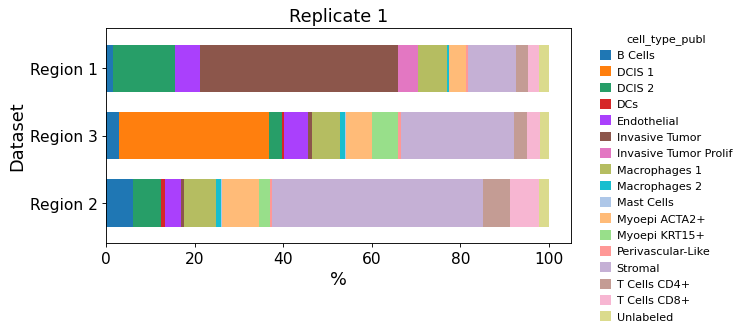

In [75]:
plot_cellular_composition(
    data=xd, cell_type_col="cell_type_publ",
    geom_key="Demo", modality="regions", max_cols=1,
    savepath="figures/cell_composition_regions_Demo_publ.pdf"
)

Since only one dataset is given, all regions are plotted into one figure.


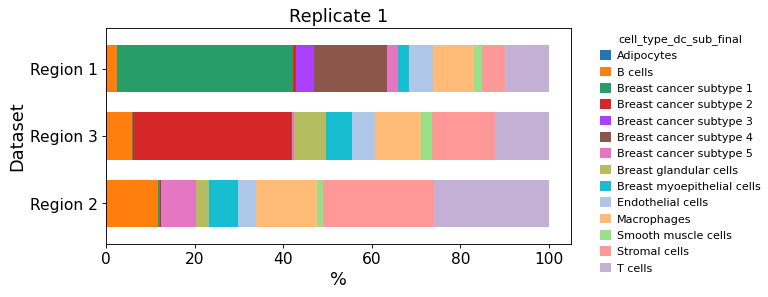

In [76]:
plot_cellular_composition(
    data=xd, cell_type_col="cell_type_dc_sub_final",
    geom_key="Demo", modality="regions", max_cols=1,
    savepath="figures/cell_composition_regions_Demo_dc_sub.pdf"
)

Since only one dataset is given, all regions are plotted into one figure.


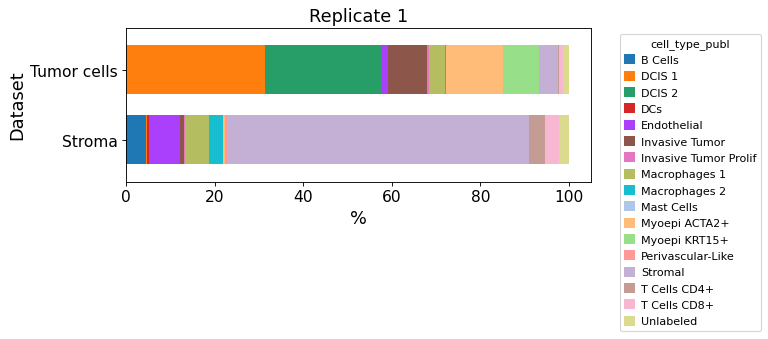

In [78]:
plot_cellular_composition(
    data=xd, cell_type_col="cell_type_publ",
    geom_key="Demo", modality="annotations", max_cols=1,
    #legend_max_per_col=5,
    savepath="figures/cell_composition_annotations_Demo_publ.pdf"
)

Since only one dataset is given, all regions are plotted into one figure.


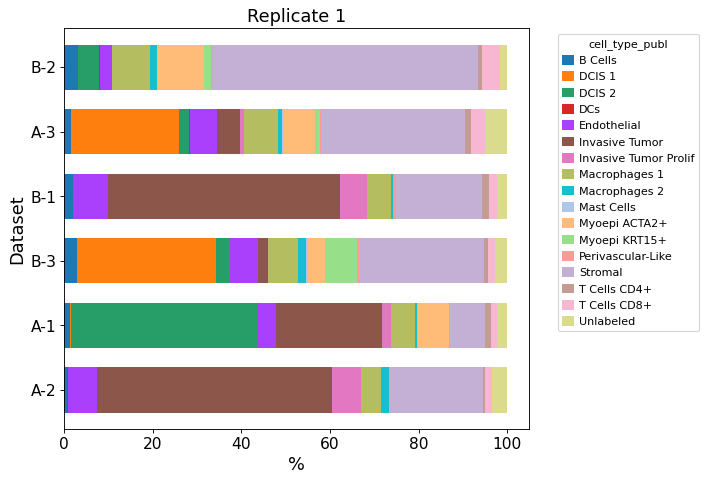

In [79]:
plot_cellular_composition(
    data=xd, cell_type_col="cell_type_publ",
    geom_key="TMA", modality="regions", max_cols=1,
    savepath="figures/cell_composition_TMA_publ.pdf"
)

Since only one dataset is given, all regions are plotted into one figure.


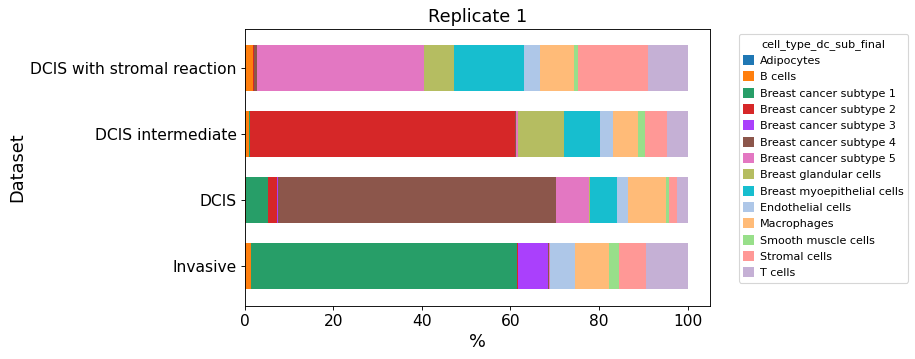

In [80]:
plot_cellular_composition(
    data=xd, cell_type_col="cell_type_dc_sub_final",
    geom_key="Katja", modality="annotations", max_cols=1,
    savepath="figures/cell_composition_annotations_Katja.pdf"
)

## Save results

In [81]:
xd.save()

Saving to existing path: C:\Users\ge37voy\.cache\InSituPy\out\demo_insitupy_project
Updating project in C:\Users\ge37voy\.cache\InSituPy\out\demo_insitupy_project
	Updating cells...
	Updating annotations...


2025-08-27 12:39:13 | [INFO] Created 5 records
2025-08-27 12:39:13 | [INFO] Created 28 records
2025-08-27 12:39:13 | [INFO] Created 5 records
2025-08-27 12:39:13 | [INFO] Created 7 records
2025-08-27 12:39:14 | [INFO] Created 28 records
2025-08-27 12:39:14 | [INFO] Created 18 records
2025-08-27 12:39:15 | [INFO] Created 18 records


	Updating regions...


2025-08-27 12:39:15 | [INFO] Created 3 records
2025-08-27 12:39:15 | [INFO] Created 6 records
2025-08-27 12:39:15 | [INFO] Created 3 records
2025-08-27 12:39:15 | [INFO] Created 4 records


Saved.


In [82]:
xd.show()